In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
nx = 8
ny = 6

objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

In [3]:
np.mgrid[0:8, 0:6].T

array([[[0, 0],
        [1, 0],
        [2, 0],
        [3, 0],
        [4, 0],
        [5, 0],
        [6, 0],
        [7, 0]],

       [[0, 1],
        [1, 1],
        [2, 1],
        [3, 1],
        [4, 1],
        [5, 1],
        [6, 1],
        [7, 1]],

       [[0, 2],
        [1, 2],
        [2, 2],
        [3, 2],
        [4, 2],
        [5, 2],
        [6, 2],
        [7, 2]],

       [[0, 3],
        [1, 3],
        [2, 3],
        [3, 3],
        [4, 3],
        [5, 3],
        [6, 3],
        [7, 3]],

       [[0, 4],
        [1, 4],
        [2, 4],
        [3, 4],
        [4, 4],
        [5, 4],
        [6, 4],
        [7, 4]],

       [[0, 5],
        [1, 5],
        [2, 5],
        [3, 5],
        [4, 5],
        [5, 5],
        [6, 5],
        [7, 5]]])

In [9]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [10]:
# Make a list of calibration images
images = glob.glob('calibration_wide/GO*.jpg')
print(images)

['calibration_wide/GOPR0055.jpg', 'calibration_wide/GOPR0034.jpg', 'calibration_wide/GOPR0048.jpg', 'calibration_wide/GOPR0035.jpg', 'calibration_wide/GOPR0059.jpg', 'calibration_wide/GOPR0049.jpg', 'calibration_wide/GOPR0041.jpg', 'calibration_wide/GOPR0046.jpg', 'calibration_wide/GOPR0070.jpg', 'calibration_wide/GOPR0047.jpg', 'calibration_wide/GOPR0043.jpg', 'calibration_wide/GOPR0060.jpg', 'calibration_wide/GOPR0044.jpg', 'calibration_wide/GOPR0032.jpg', 'calibration_wide/GOPR0069.jpg', 'calibration_wide/GOPR0040.jpg', 'calibration_wide/GOPR0067.jpg', 'calibration_wide/GOPR0033.jpg', 'calibration_wide/GOPR0038.jpg', 'calibration_wide/GOPR0052.jpg', 'calibration_wide/GOPR0045.jpg', 'calibration_wide/GOPR0066.jpg', 'calibration_wide/GOPR0051.jpg', 'calibration_wide/GOPR0037.jpg', 'calibration_wide/GOPR0042.jpg', 'calibration_wide/GOPR0036.jpg', 'calibration_wide/GOPR0062.jpg', 'calibration_wide/GOPR0068.jpg', 'calibration_wide/GOPR0061.jpg', 'calibration_wide/GOPR0054.jpg', 'calibrat

In [11]:
img = cv2.imread('calibration_wide/GOPR0050.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

print(gray.shape)
print(gray.shape[::-1])

(960, 1280)
(1280, 960)


In [ ]:
fig, axs = plt.subplots(20, 2, figsize=(12, 120))
fig.tight_layout()

for index, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    
    # Find corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret:
        print(corners[0].flatten())
        objpoints.append(objp)
        imgpoints.append(corners)
        
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        axs[index//2, index%2].imshow(img)

[244.7138  178.63393]
[115.986984 272.45755 ]
[218.90509 223.77594]
[209.52498 299.96765]
[212.3113  264.42136]
[169.48647 274.94247]
[125.489365 308.99493 ]
[412.76105 488.51132]
[158.75558 354.70657]
[591.55273 287.34644]
[279.49915 225.8156 ]
[825.0109  242.60532]
[462.56226 161.33687]
[560.5269 517.9763]
[155.93651 340.9989 ]
[308.61676 454.6131 ]
[469.38593 254.49133]
[251.58083 240.06471]
[126.80632 276.5699 ]
[ 90.28223 290.08014]
[734.4598 332.4363]
[183.32494 190.26788]
[193.93964 299.4841 ]
[390.28757 302.55762]
[250.2012  252.07393]
[234.6264 288.916 ]
[587.7969  471.52698]
[156.6257  201.07506]
[127.24407 304.76987]
[214.58818 258.954  ]
[110.58714 269.55374]
[295.24448 218.49963]
[210.5995  274.02603]
[105.65974 152.61104]
[138.32005 274.05273]


In [7]:
import pickle 
%matplotlib inline

Text(0.5,1,'Undistorted Image')

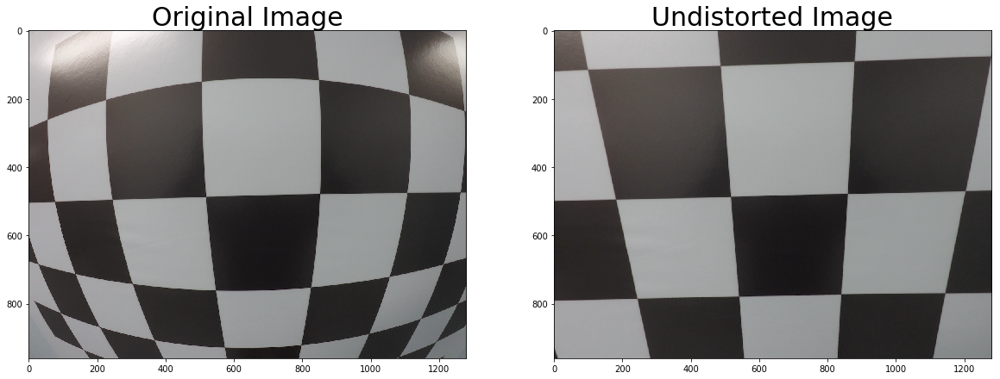

In [8]:
img = cv2.imread('calibration_wide/test_image.jpg')

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('calibration_wide/test_undist.jpg', dst)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist

pickle.dump(dist_pickle, open( "calibration_wide/wide_dist_pickle.p", "wb" ) )

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

/opt/anaconda3/envs/carnd3/lib/python3.5/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


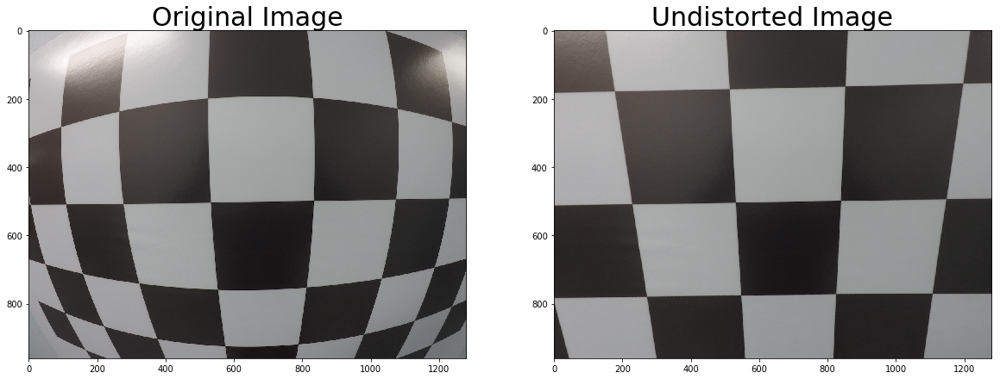

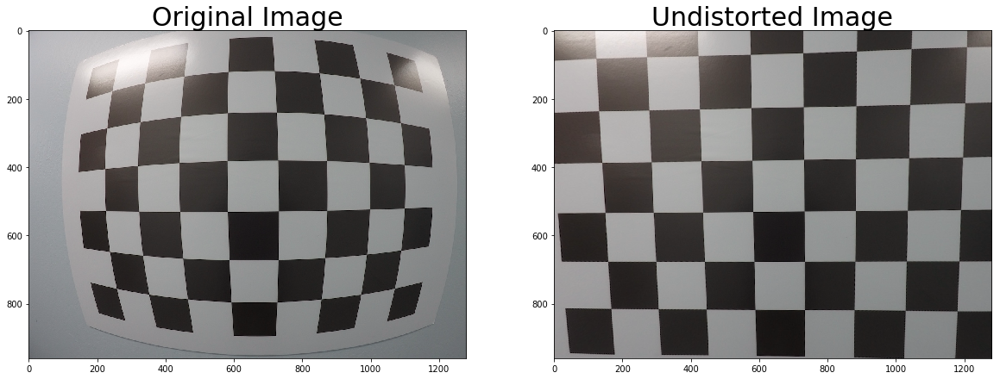

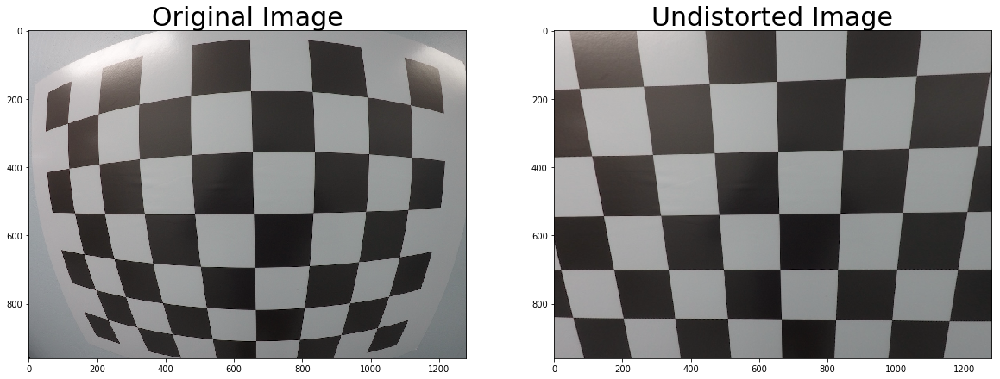

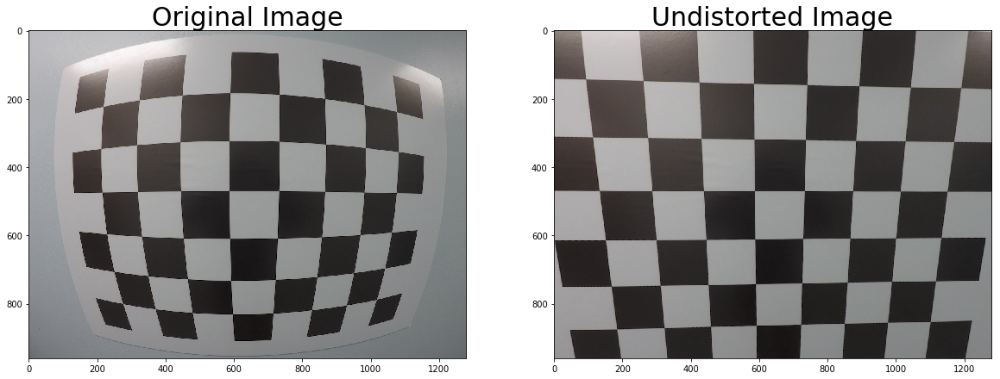

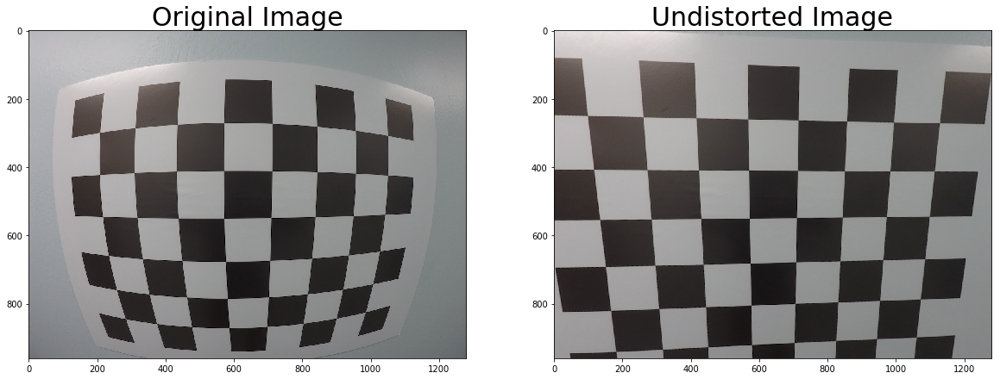

...

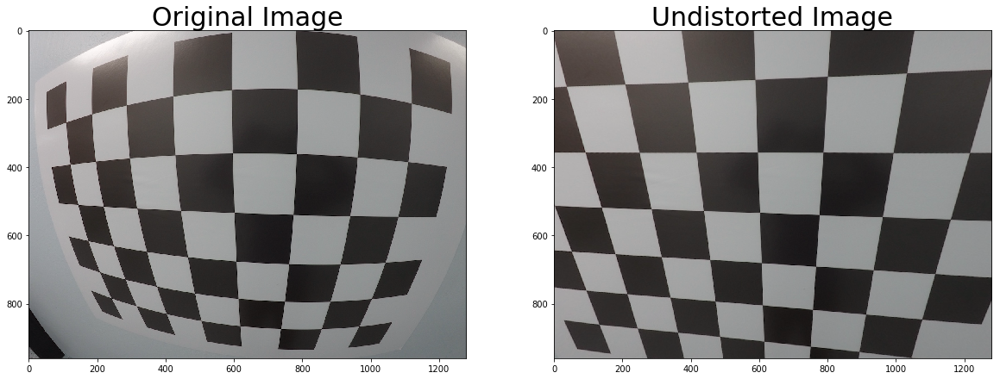

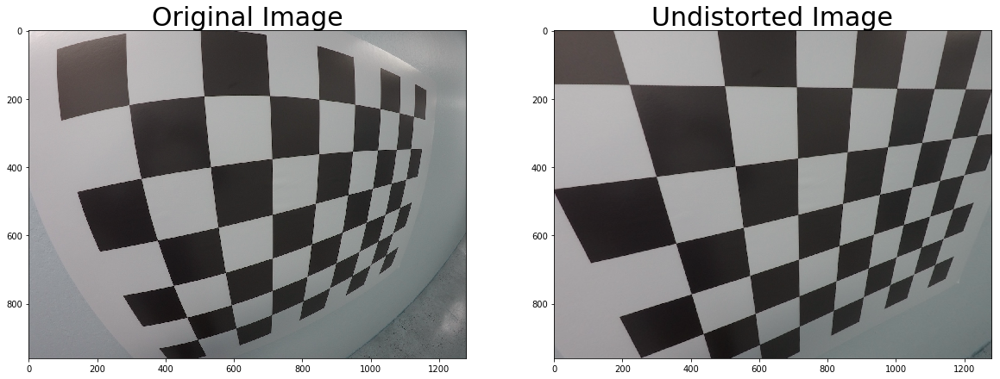

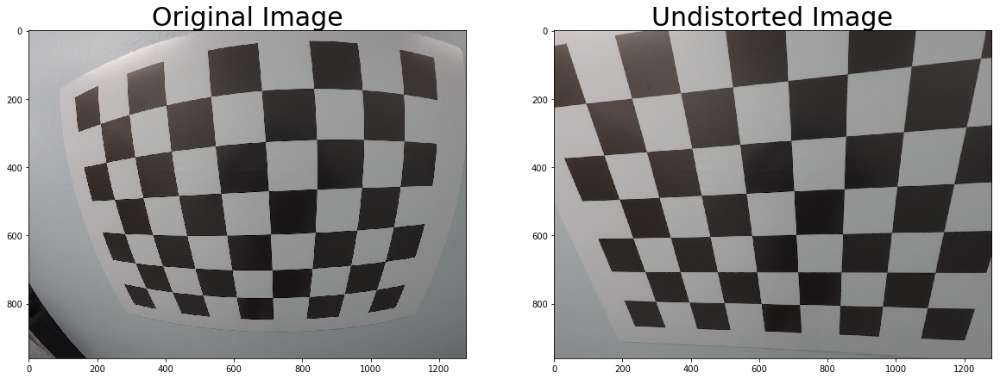

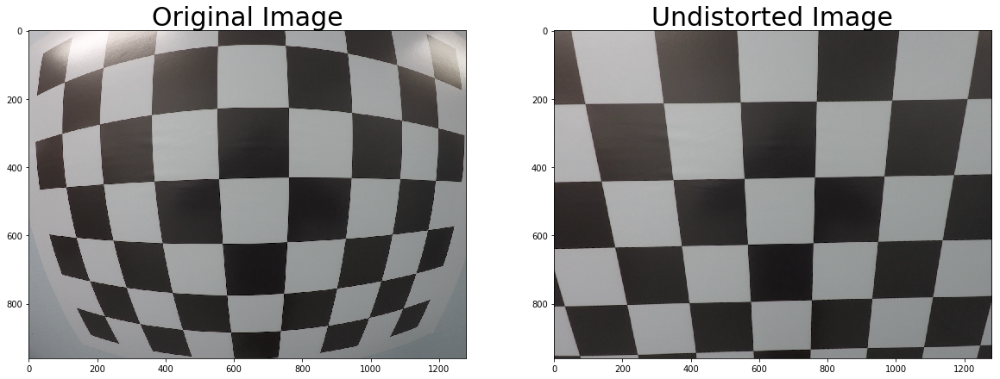

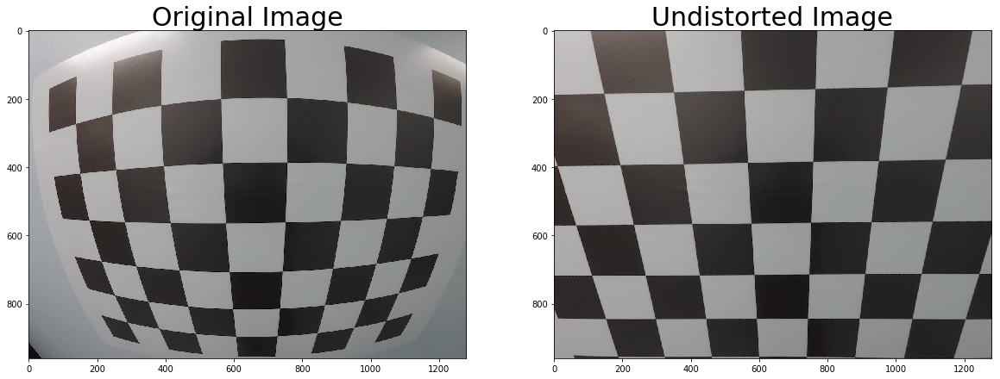

In [9]:
for index, fname in enumerate(images):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)